# Import modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string
import nltk
from nltk.corpus import stopwords
import nltk.tokenize
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Loading the Dataset
#### 1 - Positive, -1 - Negative and 0 - Neutral

In [2]:
df = pd.read_csv('Twitter_Data.csv', names = ['tweet', 'label'])
# df2 = pd.read_csv('train.csv')
df.drop(0, axis=0, inplace = True)
df.dropna(inplace = True)
df.head()

,tweet,label
1,when modi promised “minimum government maximum...,-1
2,talk all the nonsense and continue all the dra...,0
3,what did just say vote for modi welcome bjp t...,1
4,asking his supporters prefix chowkidar their n...,1
5,answer who among these the most powerful world...,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 162969 entries, 1 to 162980
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   tweet   162969 non-null  object
 1   label   162969 non-null  object
dtypes: object(2)
memory usage: 3.7+ MB


In [4]:
# df2.info()

In [5]:
df.describe()

,tweet,label
count,162969,162969
unique,162969,3
top,when modi promised “minimum government maximum...,1
freq,1,72249


In [6]:
df['length'] = df['tweet'].apply(lambda x : len(x))

# Preprocessing Dataset

##### Removing hashtags from tweets if there exists any

In [7]:
# Removes hashtags from tweets and cleans the text
def remove_patterns(tweet, pattern):
    r = re.findall(pattern, tweet)    # Finds all matching occurences in the given tweet
    for word in r:
        tweet = re.sub(word, "", tweet)    # Removes the pattern from the tweet
    return tweet

In [8]:
# Remove twitter handles if any exists
# df2['cleaned_tweets'] = np.vectorize(remove_patterns)(df2['tweet'], "@[\w]*")
# df2.head()

##### Removing Punctuations

In [9]:
# Removing punctuations
df['cleaned_tweets'] = df['tweet'].str.replace("[^a-zA-Z#]", " ")
df.head()

,tweet,label,length,cleaned_tweets
1,when modi promised “minimum government maximum...,-1,210,when modi promised minimum government maximum...
2,talk all the nonsense and continue all the dra...,0,68,talk all the nonsense and continue all the dra...
3,what did just say vote for modi welcome bjp t...,1,117,what did just say vote for modi welcome bjp t...
4,asking his supporters prefix chowkidar their n...,1,212,asking his supporters prefix chowkidar their n...
5,answer who among these the most powerful world...,1,81,answer who among these the most powerful world...


###### Removing words less than given length

In [10]:
df['cleaned_tweets'] = df['cleaned_tweets'].apply(lambda x : " ".join([w for w in x.split() if len(w) >= 3]))
df.head()

,tweet,label,length,cleaned_tweets
1,when modi promised “minimum government maximum...,-1,210,when modi promised minimum government maximum ...
2,talk all the nonsense and continue all the dra...,0,68,talk all the nonsense and continue all the dra...
3,what did just say vote for modi welcome bjp t...,1,117,what did just say vote for modi welcome bjp to...
4,asking his supporters prefix chowkidar their n...,1,212,asking his supporters prefix chowkidar their n...
5,answer who among these the most powerful world...,1,81,answer who among these the most powerful world...


##### Tokenising the tweets

In [11]:
token_tweets = df['cleaned_tweets'].apply(lambda x : nltk.word_tokenize(x))

In [12]:
token_tweets

1         [when, modi, promised, minimum, government, ma...
2         [talk, all, the, nonsense, and, continue, all,...
3         [what, did, just, say, vote, for, modi, welcom...
4         [asking, his, supporters, prefix, chowkidar, t...
5         [answer, who, among, these, the, most, powerfu...
                                ...                        
162976    [why, these, crores, paid, neerav, modi, not, ...
162977    [dear, rss, terrorist, payal, gawar, what, abo...
162978    [did, you, cover, her, interaction, forum, whe...
162979    [there, big, project, came, into, india, modi,...
162980    [have, you, ever, listen, about, like, gurukul...
Name: cleaned_tweets, Length: 162969, dtype: object

##### Stemming the tweets

In [13]:
from nltk.stem import SnowballStemmer

In [14]:
stemmer = SnowballStemmer('english')

In [15]:
# for sentence in token_tweets:
#     for word in sentence:
#         word = stemmer.stem(word)

token_tweets = token_tweets.apply(lambda x : [stemmer.stem(word) for word in x])

In [16]:
token_tweets

1         [when, modi, promis, minimum, govern, maximum,...
2         [talk, all, the, nonsens, and, continu, all, t...
3         [what, did, just, say, vote, for, modi, welcom...
4         [ask, his, support, prefix, chowkidar, their, ...
5         [answer, who, among, these, the, most, power, ...
                                ...                        
162976    [whi, these, crore, paid, neerav, modi, not, r...
162977    [dear, rss, terrorist, payal, gawar, what, abo...
162978    [did, you, cover, her, interact, forum, where,...
162979    [there, big, project, came, into, india, modi,...
162980    [have, you, ever, listen, about, like, gurukul...
Name: cleaned_tweets, Length: 162969, dtype: object

##### Combining tokenized tweet into single sentence

In [17]:
# token_tweets.dropna(inplace = True)
token_tweets = token_tweets.apply(lambda x : " ".join(x))

In [18]:
token_tweets

1         when modi promis minimum govern maximum govern...
2         talk all the nonsens and continu all the drama...
3         what did just say vote for modi welcom bjp tol...
4         ask his support prefix chowkidar their name mo...
5         answer who among these the most power world le...
                                ...                        
162976    whi these crore paid neerav modi not recov fro...
162977    dear rss terrorist payal gawar what about modi...
162978      did you cover her interact forum where she left
162979    there big project came into india modi dream p...
162980    have you ever listen about like gurukul where ...
Name: cleaned_tweets, Length: 162969, dtype: object

In [19]:
df['cleaned_tweets'] = token_tweets
df.head()

,tweet,label,length,cleaned_tweets
1,when modi promised “minimum government maximum...,-1,210,when modi promis minimum govern maximum govern...
2,talk all the nonsense and continue all the dra...,0,68,talk all the nonsens and continu all the drama...
3,what did just say vote for modi welcome bjp t...,1,117,what did just say vote for modi welcom bjp tol...
4,asking his supporters prefix chowkidar their n...,1,212,ask his support prefix chowkidar their name mo...
5,answer who among these the most powerful world...,1,81,answer who among these the most power world le...


# EDA - Exploratory Data Analysis

##### Length of tweets

<Axes: xlabel='length', ylabel='count'>

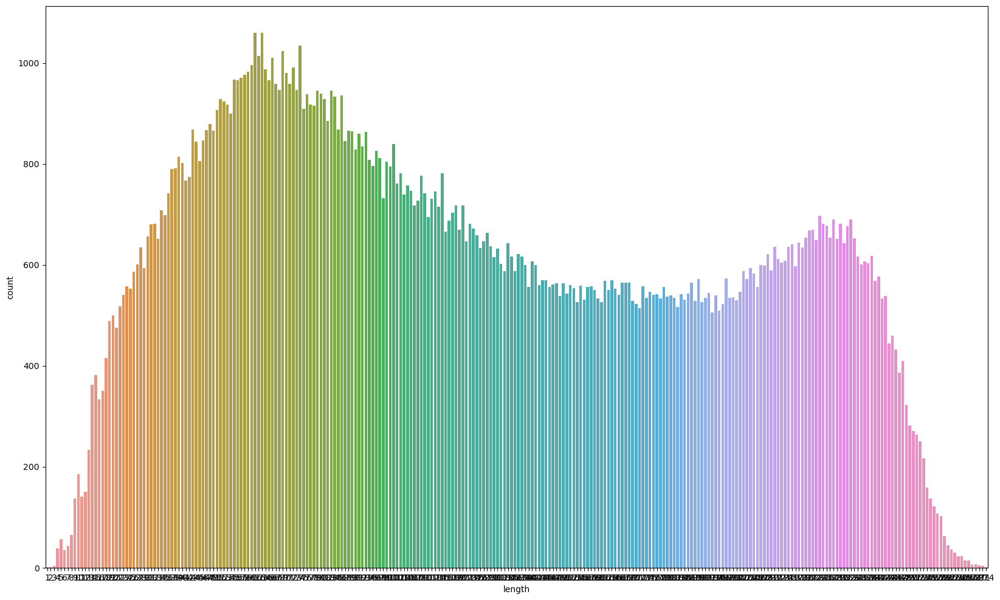

In [20]:
plt.figure(figsize=(20, 12))
plt.tight_layout()
sns.countplot(x = df['length'], data = df)

In [21]:
words = " ".join([tweet for tweet in df['cleaned_tweets']])
words

'when modi promis minimum govern maximum govern expect him begin the difficult job reform the state whi doe take year get justic state should and not busi and should exit psus and templ talk all the nonsens and continu all the drama will vote for modi what did just say vote for modi welcom bjp told you rahul the main campaign for modi think modi should just relax ask his support prefix chowkidar their name modi did great servic now there confus what read what not now crustal clear what will crass filthi nonsens see how most abus are come from chowkidar answer who among these the most power world leader today trump putin modi may kiya tho refresh maarkefir comment karo surat women perform yagna seek divin grace for narendra modi becom again this come from cabinet which has scholar like modi smriti and hema time introspect with upcom elect india saga go import pair look current modi lead govt elect with deal brexit combin this week look juici bear imho gandhi was gay doe modi thing like 

##### Most frequent words

In [22]:
from nltk.probability import FreqDist

In [ ]:
fdist = FreqDist(word.lower() for word in nltk.word_tokenize(words))

In [ ]:
fdist.most_common(10)

##### Creating a wordcloud

In [ ]:
from wordcloud import WordCloud
wordCloud = WordCloud(width = 900, height = 600, random_state = 101, max_font_size = 50).generate(words)

plt.figure(figsize = (12, 6))
plt.imshow(wordCloud)
plt.axis('off')
plt.show()

##### Visualisation of frequent words from positive tweets

In [ ]:
words_pos = " ".join([tweet for tweet in df['cleaned_tweets'][df['label'] >= '0']])
wordCloud_pos = WordCloud(width = 900, height = 600, random_state = 101, max_font_size = 50).generate(words_pos)

plt.figure(figsize = (12, 6))
plt.imshow(wordCloud_pos)
plt.axis('off')
plt.show()

##### Visualisation of frequent words from negative tweets

In [ ]:
words_neg = " ".join([tweet for tweet in df['cleaned_tweets'][df['label'] <= '0']])
wordCloud_neg = WordCloud(width = 900, height = 600, random_state = 101, max_font_size = 50).generate(words_neg)

plt.figure(figsize = (12, 6))
plt.imshow(wordCloud_neg)
plt.axis('off')
plt.show()

##### Extracting the hashtag from tweet

In [ ]:
def extractHashtag(tweets):
    hashtags = []
    for tweet in tweets:
        hashtag = re.findall(r"#(\w+)", tweet)
        hashtags.append(hashtag)
    return hashtags

In [ ]:
# Hashtags in positive tweets
positiveHashtags = extractHashtag(df['cleaned_tweets'][df['label'] >= '0'])
# positiveHashtags

In [ ]:
# Extracting hashtags from negative tweets
negativeHashtags = extractHashtag(df['cleaned_tweets'][df['label'] < '0'])

# Input Split

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
bagOfWords_Vectorizer = CountVectorizer(max_df = 0.95, min_df = 0.05, max_features = 10000, stop_words = 'english')

In [ ]:
bagOfWords = bagOfWords_Vectorizer.fit_transform(df['cleaned_tweets'])

In [ ]:
# bagOfWords

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(bagOfWords, df['label'], test_size=0.3, random_state=42)

# Model Training

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

In [ ]:
model = LogisticRegression();
model.fit(x_train, y_train)

In [ ]:
pred = model.predict(x_test)

In [ ]:
print(accuracy_score(pred, y_test))

In [9]:
import datetime
print(type(datetime.datetime(2020,6,1)))

<class 'datetime.datetime'>


In [11]:
print(type(str(datetime.datetime(2020,6,1).date())))

<class 'str'>
